<a href="https://colab.research.google.com/github/Linda-lls/GEOG0105/blob/main/1_sample_points_collection_update.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Sample points collection**

##**1. Get shapefile of Johannesburg in the ward level**

In [ ]:
! pip install osmnx

In [ ]:
! pip install matplotlib_scalebar

In [ ]:
! pip install contextily

In [ ]:
import csv
import math

import osmnx as ox
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

from matplotlib_scalebar.scalebar import ScaleBar
from shapely.geometry import LineString,Point
from shapely.geometry import Polygon

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# install the shape file of South Africa
sf = "/content/drive/MyDrive/GEOG0105/Data1/Shape Files/Shape Files/WD_SA_2011.shp"
gdf = gpd.read_file(sf)

In [ ]:
gdf

,OBJECTID,PROVINCE,CAT_B,WARDNO,WARD_ID,SUM_WARD_P,SHAPE_LENG,WARD_EXT,ALBERS_ARE,SHAPE_Le_1,SHAPE_Area,geometry
0,1,Eastern Cape,BUF,1,29200001,6724.0,0.061651,BUF_Ward_2011,1.222080,0.061651,0.000118,"POLYGON ((27.87799 -32.99797, 27.87822 -32.997..."
1,7,Eastern Cape,BUF,7,29200007,7760.0,0.040492,BUF_Ward_2011,0.512239,0.040492,0.000049,"POLYGON ((27.86351 -33.00779, 27.86366 -33.007..."
2,11,Eastern Cape,BUF,11,29200011,8242.0,0.223473,BUF_Ward_2011,9.943439,0.223473,0.000959,"POLYGON ((27.75175 -32.94361, 27.75334 -32.945..."
3,12,Eastern Cape,BUF,12,29200012,8277.0,0.447423,BUF_Ward_2011,37.954289,0.447423,0.003659,"POLYGON ((27.80204 -32.90777, 27.80168 -32.908..."
4,13,Eastern Cape,BUF,13,29200013,7144.0,0.403721,BUF_Ward_2011,33.936851,0.403721,0.003274,"POLYGON ((27.78932 -32.93572, 27.78947 -32.937..."
...,...,...,...,...,...,...,...,...,...,...,...,...
4272,4231,Western Cape,WC044,22,10404022,3196.0,1.213036,WC044_Ward_2011,390.568896,1.213036,0.038077,"POLYGON ((22.47467 -33.83343, 22.47404 -33.839..."
4273,4232,Western Cape,WC044,23,10404023,3355.0,0.607426,WC044_Ward_2011,75.383242,0.607426,0.007358,"POLYGON ((22.45586 -33.97803, 22.45314 -33.979..."
4274,4233,Western Cape,WC044,24,10404024,2965.0,2.921395,WC044_Ward_2011,1869.380280,2.921395,0.181743,"POLYGON ((23.46238 -33.44741, 23.46761 -33.448..."
4275,4234,Western Cape,WC044,25,10404025,3105.0,3.607002,WC044_Ward_2011,2299.942464,3.607002,0.223433,"POLYGON ((23.19537 -33.38615, 23.19568 -33.386..."


In [ ]:
print(gdf.crs)

EPSG:4148


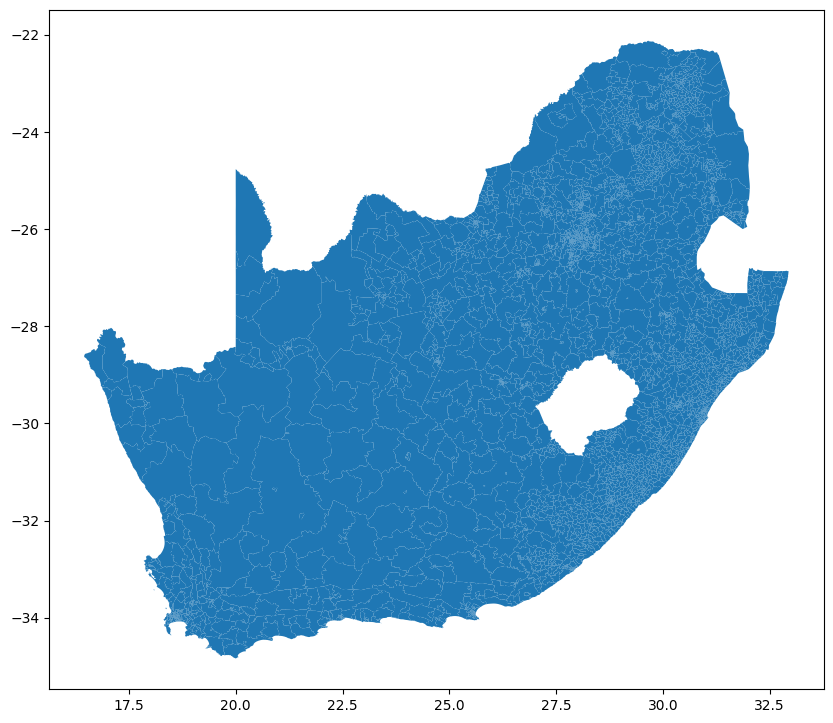

In [ ]:
ax = gdf.plot(figsize=(10, 10))
plt.show()

In [ ]:
# get the shapefile of J'burg
JHB_gdf = gdf[gdf['CAT_B'] == 'JHB']
JHB_gdf

,OBJECTID,PROVINCE,CAT_B,WARDNO,WARD_ID,SUM_WARD_P,SHAPE_LENG,WARD_EXT,ALBERS_ARE,SHAPE_Le_1,SHAPE_Area,geometry
172,1323,Gauteng,JHB,18,79800018,16519.0,0.108894,JHB_Ward_2011,5.777672,0.108894,0.000522,"POLYGON ((27.91502 -26.28289, 27.91530 -26.282..."
173,1327,Gauteng,JHB,22,79800022,17174.0,0.091681,JHB_Ward_2011,3.996108,0.091681,0.000361,"POLYGON ((27.90709 -26.26680, 27.90710 -26.267..."
174,1332,Gauteng,JHB,27,79800027,13547.0,0.052714,JHB_Ward_2011,1.355362,0.052714,0.000122,"POLYGON ((27.96015 -26.23970, 27.96074 -26.241..."
186,1313,Gauteng,JHB,8,79800008,14177.0,0.250572,JHB_Ward_2011,20.526095,0.250572,0.001856,"POLYGON ((27.82680 -26.32418, 27.82815 -26.325..."
207,1314,Gauteng,JHB,9,79800009,16182.0,0.234492,JHB_Ward_2011,12.919736,0.234492,0.001168,"POLYGON ((27.85160 -26.29897, 27.85514 -26.300..."
...,...,...,...,...,...,...,...,...,...,...,...,...
2018,1378,Gauteng,JHB,73,79800073,13740.0,0.149877,JHB_Ward_2011,10.060980,0.149877,0.000908,"POLYGON ((28.07300 -26.14679, 28.07300 -26.146..."
2019,1379,Gauteng,JHB,74,79800074,13713.0,0.196546,JHB_Ward_2011,13.467435,0.196546,0.001216,"POLYGON ((28.08819 -26.11796, 28.09158 -26.122..."
2020,1385,Gauteng,JHB,80,79800080,14573.0,0.080958,JHB_Ward_2011,1.774418,0.080958,0.000160,"POLYGON ((28.17046 -26.02095, 28.17091 -26.021..."
2021,1386,Gauteng,JHB,81,79800081,15679.0,0.182113,JHB_Ward_2011,12.967975,0.182113,0.001170,"POLYGON ((28.12625 -26.10587, 28.12908 -26.109..."


In [ ]:
JHB_gdf.to_file('/content/drive/MyDrive/GEOG0105/Output_1/WD_JHB.shp')

print("Shapefile saved successfully.")

Shapefile saved successfully.


In [ ]:
JHB_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 130 entries, 172 to 2022
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   OBJECTID    130 non-null    int64   
 1   PROVINCE    130 non-null    object  
 2   CAT_B       130 non-null    object  
 3   WARDNO      130 non-null    int64   
 4   WARD_ID     130 non-null    object  
 5   SUM_WARD_P  130 non-null    float64 
 6   SHAPE_LENG  130 non-null    float64 
 7   WARD_EXT    130 non-null    object  
 8   ALBERS_ARE  130 non-null    float64 
 9   SHAPE_Le_1  130 non-null    float64 
 10  SHAPE_Area  130 non-null    float64 
 11  geometry    130 non-null    geometry
dtypes: float64(5), geometry(1), int64(2), object(4)
memory usage: 13.2+ KB


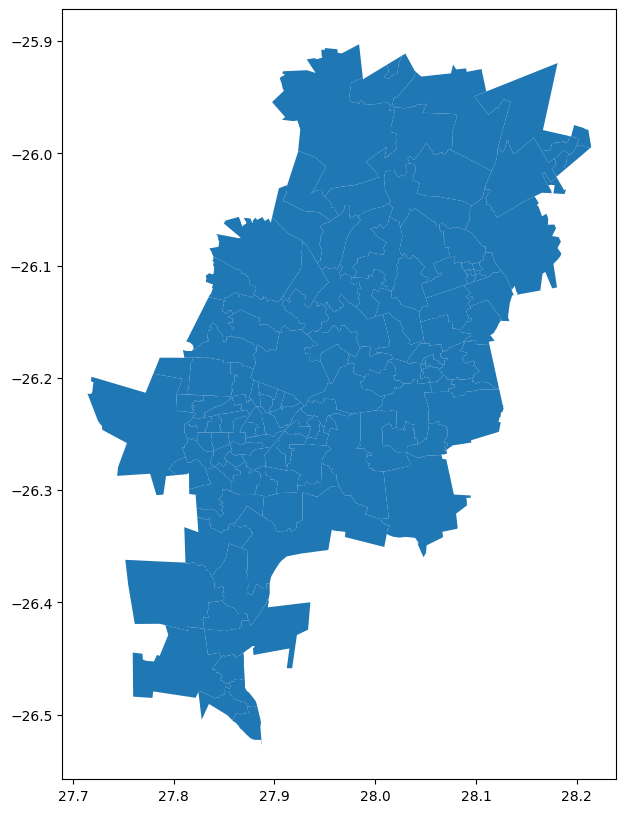

In [ ]:
JHB_ax = JHB_gdf.plot(figsize=(10, 10))
plt.show()

##**2. Get street network of JHB**

In [ ]:
# get the boudary of J'burg to ensure the dist in street network
JHB_boundary = JHB_gdf.geometry.total_bounds
JHB_boundary

array([ 27.71427, -26.52629,  28.21446, -25.90283])

In [ ]:
# get the street network of J'burg
bbox = Polygon([(27.71427,  -26.52629), (28.21446, -26.52629),(28.21446, -25.90283),(27.71427,  -25.90283)])
G = ox.graph_from_polygon(bbox, network_type="drive")

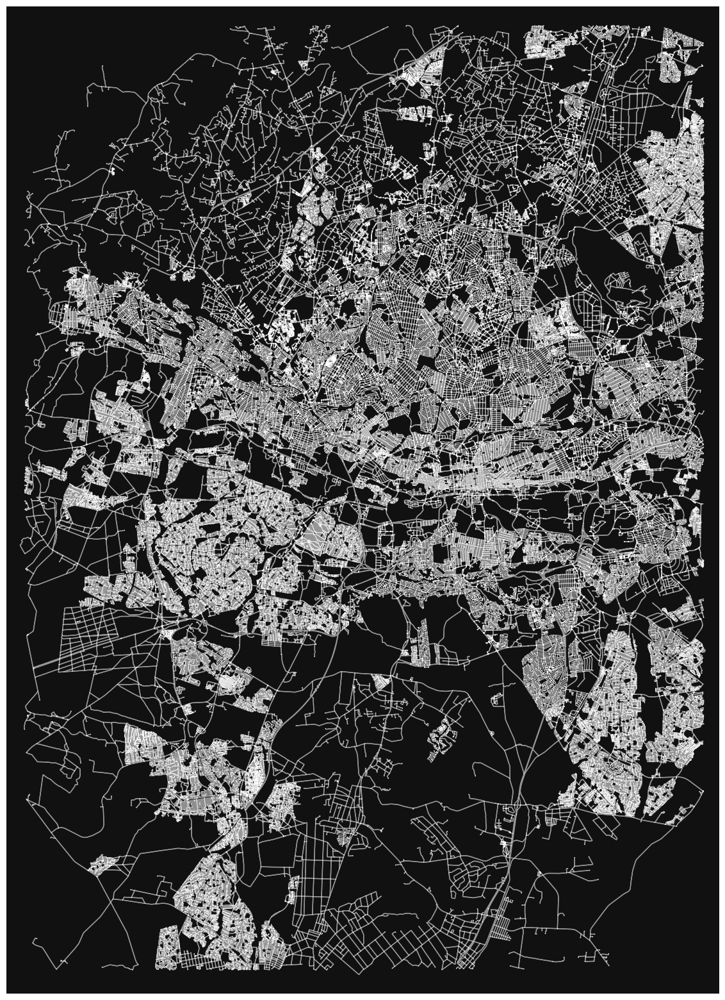

(<Figure size 2000x2000 with 1 Axes>, <Axes: >)

In [ ]:
ox.plot_graph(G, node_size=1, figsize=(20, 20))

##**3. Get centroid information of each edge**

In [ ]:
# get information of each edge
nodes, edges = ox.graph_to_gdfs(G, nodes=True, edges=True)

In [ ]:
# get centroid of each edge
edges['midpoint'] = ''
for i in range(0,len(edges)):
    midpoint = edges['geometry'].iloc[i].interpolate(0.5, normalized = True)
    edges['midpoint'].iloc[i] = midpoint

<ipython-input-12-472eeb18bf74>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  edges['midpoint'].iloc[i] = midpoint


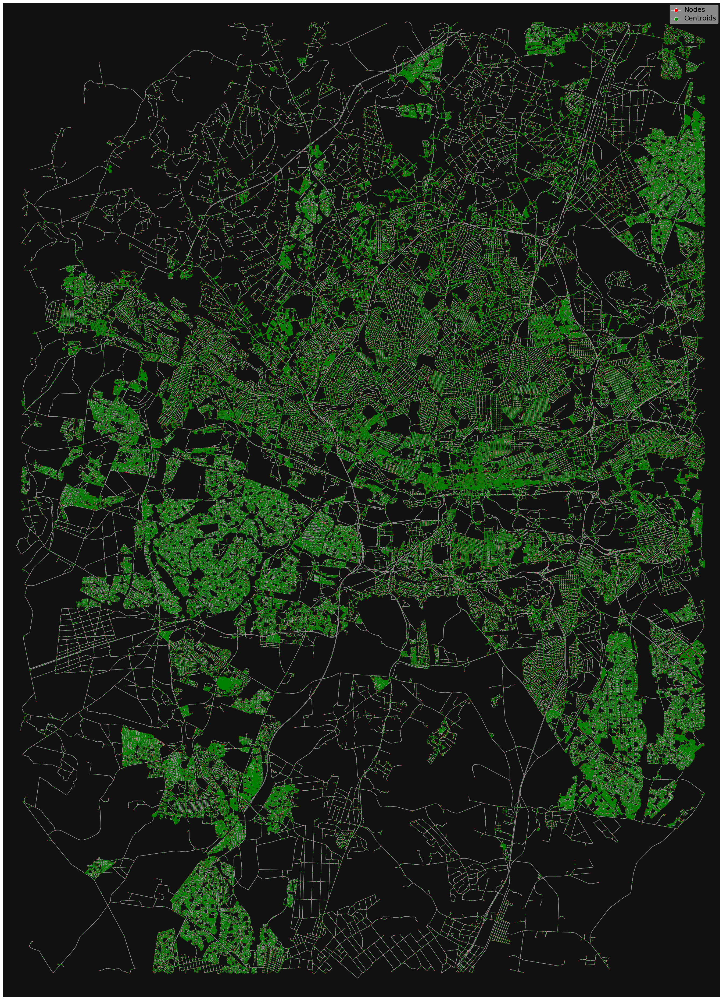

In [ ]:
# Create a legend for the graph
legend_labels = ['Nodes', 'Centroids']
legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='r', markersize=10, label='Nodes'),
                  plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='g', markersize=10, label='Centroids')]

# Visualize centroids and edges
fig, ax = ox.plot_graph(G, node_size=2, figsize=(48, 48), node_color='r', show=False, close=False)

for i in range(len(edges)):
    ax.scatter(edges['midpoint'].iloc[i].x, edges['midpoint'].iloc[i].y, c='g', s=2)

# Add the legend to the plot
ax.legend(handles=legend_handles, labels=legend_labels, loc='upper right', framealpha=0.5, fontsize='large')

for text in ax.legend_.get_texts():
    text.set_fontsize(1.5 * text.get_fontsize())

# Show the plot
plt.show()

In [ ]:
print(len(edges))
edges.head()

312055


osmid  \
u        v         key                                                      
21588150 21588161  0    [65200257, 250052444, 166769679, 65201496, 652...   
21588161 289062468 0                                             26386063   
         21588164  0                                            250052444   
21588164 252016520 0                        [62051190, 8021038, 62051191]   
         252016478 0                                             26375468   

                        oneway   lanes     ref             name  \
u        v         key                                            
21588150 21588161  0      True  [4, 5]  N3;N12   Eastern Bypass   
21588161 289062468 0      True       1     NaN              NaN   
         21588164  0      True       5  N3;N12   Eastern Bypass   
21588164 252016520 0      True       3     N12  Southern Bypass   
         252016478 0      True       5      N3              NaN   

                              highway maxspeed reversed    length bridge  \
u        v         key                                                     
21588150 21588161  0         motorway      120    False  1902.370    yes   
21588161 289062468 0    motorway_link      NaN    False  1016.758    NaN   
         21588164  0         motorway      120    False   549.134    NaN   
21588164 252016520 0         motorway      120    False  1166.879    yes   
         252016478 0         motorway      120    False   861.545    NaN   

                                                                 geometry  \
u        v         key                                                      
21588150 21588161  0    LINESTRING (28.13226 -26.21563, 28.13220 -26.2...   
21588161 289062468 0    LINESTRING (28.12582 -26.23139, 28.12582 -26.2...   
         21588164  0    LINESTRING (28.12582 -26.23139, 28.12545 -26.2...   
21588164 252016520 0    LINESTRING (28.12561 -26.23630, 28.12570 -26.2...   
         252016478 0    LINESTRING (28.12561 -26.23630, 28.12584 -26.2...   

                       junction tunnel access service width  \
u        v         key                                        
21588150 21588161  0        NaN    NaN    NaN     NaN   NaN   
21588161 289062468 0        NaN    NaN    NaN     NaN   NaN   
         21588164  0        NaN    NaN    NaN     NaN   NaN   
21588164 252016520 0        NaN    NaN    NaN     NaN   NaN   
         252016478 0        NaN    NaN    NaN     NaN   NaN   

                                                              midpoint  
u        v         key                                                  
21588150 21588161  0    POINT (28.127485369028065 -26.222887720133677)  
21588161 289062468 0     POINT (28.126295019425207 -26.23599618800245)  
         21588164  0     POINT (28.12552894802145 -26.233845169468083)  
21588164 252016520 0      POINT (28.12606432363131 -26.24134421420509)  
         252016478 0     POINT (28.128077968669178 -26.23945276641551)

In [ ]:
edges.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
MultiIndex: 312055 entries, (21588150, 21588161, 0) to (11029737172, 9188646624, 0)
Data columns (total 17 columns):
 #   Column    Non-Null Count   Dtype   
---  ------    --------------   -----   
 0   osmid     312055 non-null  object  
 1   oneway    312055 non-null  bool    
 2   lanes     113892 non-null  object  
 3   ref       15262 non-null   object  
 4   name      216299 non-null  object  
 5   highway   312055 non-null  object  
 6   maxspeed  22152 non-null   object  
 7   reversed  312055 non-null  object  
 8   length    312055 non-null  float64 
 9   bridge    1800 non-null    object  
 10  geometry  312055 non-null  geometry
 11  junction  4500 non-null    object  
 12  tunnel    56 non-null      object  
 13  access    1307 non-null    object  
 14  service   2 non-null       object  
 15  width     118 non-null     object  
 16  midpoint  312055 non-null  object  
dtypes: bool(1), float64(1), geometry(1), object(14)
memor

In [ ]:
# save edges as csv, and save the starting node 'u' and ending node 'v'(index)
csv_path1 = '/content/drive/MyDrive/GEOG0105/Output_1/edges.csv'
edges.to_csv(csv_path1, index=True)

In [ ]:
# get azimuths of each edge
G1 = ox.add_edge_bearings(G)

In [ ]:
azimuths = list(G1.edges(data=True))

In [ ]:
print(azimuths[:5])

[(21588150, 21588161, {'osmid': [65200257, 250052444, 166769679, 65201496, 65200252, 65201501], 'oneway': True, 'lanes': ['4', '5'], 'ref': 'N3;N12', 'name': 'Eastern Bypass', 'highway': 'motorway', 'maxspeed': '120', 'reversed': False, 'length': 1902.3700000000001, 'bridge': 'yes', 'geometry': <LINESTRING (28.132 -26.216, 28.132 -26.216, 28.132 -26.216, 28.131 -26.218,...>, 'bearing': 200.1}), (21588161, 289062468, {'osmid': 26386063, 'oneway': True, 'lanes': '1', 'highway': 'motorway_link', 'reversed': False, 'length': 1016.7579999999999, 'geometry': <LINESTRING (28.126 -26.231, 28.126 -26.232, 28.126 -26.233, 28.126 -26.234,...>, 'bearing': 161.7}), (21588161, 21588164, {'osmid': 250052444, 'oneway': True, 'lanes': '5', 'ref': 'N3;N12', 'name': 'Eastern Bypass', 'highway': 'motorway', 'maxspeed': '120', 'reversed': False, 'length': 549.134, 'geometry': <LINESTRING (28.126 -26.231, 28.125 -26.234, 28.125 -26.235, 28.125 -26.236,...>, 'bearing': 182.2}), (21588164, 252016520, {'osmid'

In [ ]:
# Extract the starting node, ending node, and bearing from the azimuths list
data_dict = [
    {
        'start_node': u,
        'end_node': v,
        'bearing': data.get('bearing', None)
    }
    for u, v, data in azimuths
]
# Create a new DataFrame from the data dictionary
df_azimuths = pd.DataFrame(data_dict)

In [ ]:
df_azimuths.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 312055 entries, 0 to 312054
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   start_node  312055 non-null  int64  
 1   end_node    312055 non-null  int64  
 2   bearing     310098 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 7.1 MB


In [ ]:
df_azimuths.head()

,start_node,end_node,bearing
0,21588150,21588161,200.1
1,21588161,289062468,161.7
2,21588161,21588164,182.2
3,21588164,252016520,188.4
4,21588164,252016478,139.1


In [ ]:
edges_uv = pd.read_csv('/content/drive/MyDrive/GEOG0105/Output_1/edges.csv')

<ipython-input-135-981239797473>:1: DtypeWarning: Columns (9,17,18) have mixed types. Specify dtype option on import or set low_memory=False.
  edges_uv = pd.read_csv('/content/drive/MyDrive/GEOG0105/Output_1/edges.csv')


In [ ]:
edges_uv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 312055 entries, 0 to 312054
Data columns (total 20 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   u         312055 non-null  int64  
 1   v         312055 non-null  int64  
 2   key       312055 non-null  int64  
 3   osmid     312055 non-null  object 
 4   oneway    312055 non-null  bool   
 5   lanes     113892 non-null  object 
 6   ref       15262 non-null   object 
 7   name      216299 non-null  object 
 8   highway   312055 non-null  object 
 9   maxspeed  22152 non-null   object 
 10  reversed  312055 non-null  object 
 11  length    312055 non-null  float64
 12  bridge    1800 non-null    object 
 13  geometry  312055 non-null  object 
 14  junction  4500 non-null    object 
 15  tunnel    56 non-null      object 
 16  access    1307 non-null    object 
 17  service   2 non-null       object 
 18  width     118 non-null     object 
 19  midpoint  312055 non-null  object 
dtypes: b

In [ ]:
merged_edges = pd.concat([edges_uv, df_azimuths], axis=1)

merged_edges.head()

,u,v,key,osmid,oneway,lanes,ref,name,highway,maxspeed,...,geometry,junction,tunnel,access,service,width,midpoint,start_node,end_node,bearing
0,21588150,21588161,0,"(65200257, 250052444, 166769679, 65201496, 652...",True,"['4', '5']",N3;N12,Eastern Bypass,motorway,120,...,"LINESTRING (28.1322606 -26.2156285, 28.1322004...",NaN,NaN,NaN,NaN,NaN,POINT (28.127485369028065 -26.222887720133677),21588150,21588161,200.1
1,21588161,289062468,0,26386063,True,1,NaN,NaN,motorway_link,NaN,...,"LINESTRING (28.1258226 -26.2313898, 28.1258195...",NaN,NaN,NaN,NaN,NaN,POINT (28.126295019425207 -26.23599618800245),21588161,289062468,161.7
2,21588161,21588164,0,250052444,True,5,N3;N12,Eastern Bypass,motorway,120,...,"LINESTRING (28.1258226 -26.2313898, 28.1254533...",NaN,NaN,NaN,NaN,NaN,POINT (28.12552894802145 -26.233845169468083),21588161,21588164,182.2
3,21588164,252016520,0,"(62051190, 8021038, 62051191)",True,3,N12,Southern Bypass,motorway,120,...,"LINESTRING (28.125612 -26.2362982, 28.1257001 ...",NaN,NaN,NaN,NaN,NaN,POINT (28.12606432363131 -26.24134421420509),21588164,252016520,188.4
4,21588164,252016478,0,26375468,True,5,N3,NaN,motorway,120,...,"LINESTRING (28.125612 -26.2362982, 28.1258419 ...",NaN,NaN,NaN,NaN,NaN,POINT (28.128077968669178 -26.23945276641551),21588164,252016478,139.1


In [ ]:
# Check if 'u' and 'start_node' are the same for each row
is_same = merged_edges['u'] == merged_edges['start_node']

# Check if all elements are True (i.e., 'u' and 'start_node' are the same for each row)
are_same_for_all_rows = is_same.all()

print(are_same_for_all_rows)

True


In [ ]:
# Check if 'v' and 'end_node' are the same for each row
is_same = merged_edges['v'] == merged_edges['end_node']

# Check if all elements are True (i.e., 'u' and 'start_node' are the same for each row)
are_same_for_all_rows = is_same.all()

print(are_same_for_all_rows)

True


In [ ]:
merged_edges.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 312055 entries, 0 to 312054
Data columns (total 23 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   u           312055 non-null  int64  
 1   v           312055 non-null  int64  
 2   key         312055 non-null  int64  
 3   osmid       312055 non-null  object 
 4   oneway      312055 non-null  bool   
 5   lanes       113892 non-null  object 
 6   ref         15262 non-null   object 
 7   name        216299 non-null  object 
 8   highway     312055 non-null  object 
 9   maxspeed    22152 non-null   object 
 10  reversed    312055 non-null  object 
 11  length      312055 non-null  float64
 12  bridge      1800 non-null    object 
 13  geometry    312055 non-null  object 
 14  junction    4500 non-null    object 
 15  tunnel      56 non-null      object 
 16  access      1307 non-null    object 
 17  service     2 non-null       object 
 18  width       118 non-null     object 
 19  mi

In [ ]:
# Convert the string representations of Point objects to actual Point objects
def create_point_from_str(point_str):
    if pd.notna(point_str):
        coords = tuple(map(float, point_str.replace('POINT (', '').replace(')', '').split()))
        return Point(coords)
    else:
        return None

merged_edges['midpoint'] = merged_edges['midpoint'].apply(create_point_from_str)

# Extract 'lon' and 'lat' from the 'midpoint' column
merged_edges['lon'] = merged_edges['midpoint'].apply(lambda point: point.x if point is not None else None)
merged_edges['lat'] = merged_edges['midpoint'].apply(lambda point: point.y if point is not None else None)


In [ ]:
merged_edges.head()

,u,v,key,osmid,oneway,lanes,ref,name,highway,maxspeed,...,tunnel,access,service,width,midpoint,start_node,end_node,bearing,lon,lat
0,21588150,21588161,0,"(65200257, 250052444, 166769679, 65201496, 652...",True,"['4', '5']",N3;N12,Eastern Bypass,motorway,120,...,NaN,NaN,NaN,NaN,POINT (28.127485369028065 -26.222887720133677),21588150,21588161,200.1,28.127485,-26.222888
1,21588161,289062468,0,26386063,True,1,NaN,NaN,motorway_link,NaN,...,NaN,NaN,NaN,NaN,POINT (28.126295019425207 -26.23599618800245),21588161,289062468,161.7,28.126295,-26.235996
2,21588161,21588164,0,250052444,True,5,N3;N12,Eastern Bypass,motorway,120,...,NaN,NaN,NaN,NaN,POINT (28.12552894802145 -26.233845169468083),21588161,21588164,182.2,28.125529,-26.233845
3,21588164,252016520,0,"(62051190, 8021038, 62051191)",True,3,N12,Southern Bypass,motorway,120,...,NaN,NaN,NaN,NaN,POINT (28.12606432363131 -26.24134421420509),21588164,252016520,188.4,28.126064,-26.241344
4,21588164,252016478,0,26375468,True,5,N3,NaN,motorway,120,...,NaN,NaN,NaN,NaN,POINT (28.128077968669178 -26.23945276641551),21588164,252016478,139.1,28.128078,-26.239453


In [ ]:
# save the dataframe of merged edges as csv
csv_path2 = '/content/drive/MyDrive/GEOG0105/Output_1/merged_edges.csv'
merged_edges.to_csv(csv_path2, index=True)

In [ ]:
# create a new dataframe for centroids information
centroids = merged_edges[['lon', 'lat', 'bearing']]
print(centroids.info())
centroids.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 312055 entries, 0 to 312054
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   lon      312055 non-null  float64
 1   lat      312055 non-null  float64
 2   bearing  310098 non-null  float64
dtypes: float64(3)
memory usage: 7.1 MB
None


,lon,lat,bearing
0,28.127485,-26.222888,200.1
1,28.126295,-26.235996,161.7
2,28.125529,-26.233845,182.2
3,28.126064,-26.241344,188.4
4,28.128078,-26.239453,139.1


In [ ]:
centroids = centroids.dropna(subset=['bearing'])
print(centroids.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 310098 entries, 0 to 312054
Data columns (total 3 columns):
 #   Column   Non-Null Count   Dtype  
---  ------   --------------   -----  
 0   lon      310098 non-null  float64
 1   lat      310098 non-null  float64
 2   bearing  310098 non-null  float64
dtypes: float64(3)
memory usage: 9.5 MB
None


In [ ]:
# save the dataframe of centroids as csv
csv_path3 = '/content/drive/MyDrive/GEOG0105/Output_1/centroids.csv'
centroids.to_csv(csv_path3, index=True)

##**4. Select 50 centroid points each ward within JHB**

In [ ]:
# Convert the df of centroids to a geopandas GeoDataFrame
geometry = gpd.points_from_xy(centroids['lon'], centroids['lat'])
gdf1 = gpd.GeoDataFrame(centroids, geometry=geometry)

In [ ]:
gdf1.head()

,lon,lat,bearing,geometry
0,28.127485,-26.222888,200.1,POINT (28.12749 -26.22289)
1,28.126295,-26.235996,161.7,POINT (28.12630 -26.23600)
2,28.125529,-26.233845,182.2,POINT (28.12553 -26.23385)
3,28.126064,-26.241344,188.4,POINT (28.12606 -26.24134)
4,28.128078,-26.239453,139.1,POINT (28.12808 -26.23945)


In [ ]:
print(gdf1.crs)

None


In [ ]:
gdf1 = gdf1.set_crs(epsg=4148)
gdf1 = gdf1.to_crs(epsg=4148)

In [ ]:
# spatial join
result = gpd.sjoin(gdf1, JHB_gdf, op='within', how='inner')

/usr/local/lib/python3.10/dist-packages/IPython/core/interactiveshell.py:3473: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):


In [ ]:
result

,lon,lat,bearing,geometry,index_right,OBJECTID,PROVINCE,CAT_B,WARDNO,WARD_ID,SUM_WARD_P,SHAPE_LENG,WARD_EXT,ALBERS_ARE,SHAPE_Le_1,SHAPE_Area
99,28.007267,-26.216176,341.2,POINT (28.00727 -26.21618),1545,1373,Gauteng,JHB,68,79800068,16056.0,0.228464,JHB_Ward_2011,17.608392,0.228464,0.001590
100,28.007088,-26.216293,252.6,POINT (28.00709 -26.21629),1545,1373,Gauteng,JHB,68,79800068,16056.0,0.228464,JHB_Ward_2011,17.608392,0.228464,0.001590
293,27.980736,-26.222697,357.0,POINT (27.98074 -26.22270),1545,1373,Gauteng,JHB,68,79800068,16056.0,0.228464,JHB_Ward_2011,17.608392,0.228464,0.001590
294,27.980579,-26.222285,327.6,POINT (27.98058 -26.22229),1545,1373,Gauteng,JHB,68,79800068,16056.0,0.228464,JHB_Ward_2011,17.608392,0.228464,0.001590
1644,27.997034,-26.217737,29.2,POINT (27.99703 -26.21774),1545,1373,Gauteng,JHB,68,79800068,16056.0,0.228464,JHB_Ward_2011,17.608392,0.228464,0.001590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
311856,27.845413,-26.137120,94.1,POINT (27.84541 -26.13712),2006,1376,Gauteng,JHB,71,79800071,15084.0,0.219491,JHB_Ward_2011,11.817950,0.219491,0.001067
311857,27.844858,-26.138462,193.1,POINT (27.84486 -26.13846),2006,1376,Gauteng,JHB,71,79800071,15084.0,0.219491,JHB_Ward_2011,11.817950,0.219491,0.001067
311914,27.835407,-26.142527,194.6,POINT (27.83541 -26.14253),2006,1376,Gauteng,JHB,71,79800071,15084.0,0.219491,JHB_Ward_2011,11.817950,0.219491,0.001067
311915,27.835762,-26.142203,145.7,POINT (27.83576 -26.14220),2006,1376,Gauteng,JHB,71,79800071,15084.0,0.219491,JHB_Ward_2011,11.817950,0.219491,0.001067


In [ ]:
num_unique_wards = result['WARD_ID'].nunique()

print("Number of unique elements in the 'WARD_ID' column:", num_unique_wards)

Number of unique elements in the 'WARD_ID' column: 130


In [ ]:
# save the dataframe of centroids within JHB as csv
csv_path4 = '/content/drive/MyDrive/GEOG0105/Output_1/result.csv'
result.to_csv(csv_path4, index=True)

In [ ]:
# select 50 points in each ward randomly
sample_points = result.groupby('WARD_ID').apply(lambda x: x.sample(50)).reset_index(drop=True)

print(sample_points)

            lon        lat  bearing                    geometry  index_right  \
0     27.831881 -26.486427    252.9  POINT (27.83188 -26.48643)         1392   
1     27.843305 -26.487520    317.2  POINT (27.84330 -26.48752)         1392   
2     27.833838 -26.489565    121.5  POINT (27.83384 -26.48956)         1392   
3     27.856620 -26.495179    326.0  POINT (27.85662 -26.49518)         1392   
4     27.857443 -26.497845    164.5  POINT (27.85744 -26.49785)         1392   
...         ...        ...      ...                         ...          ...   
6495  27.816210 -26.245107     89.5  POINT (27.81621 -26.24511)         2009   
6496  27.820845 -26.248996    218.6  POINT (27.82085 -26.24900)         2009   
6497  27.813604 -26.249799    137.6  POINT (27.81360 -26.24980)         2009   
6498  27.818950 -26.251149    314.9  POINT (27.81895 -26.25115)         2009   
6499  27.813272 -26.248772    261.7  POINT (27.81327 -26.24877)         2009   

      OBJECTID PROVINCE CAT_B  WARDNO  

In [ ]:
# save the sample points as csv
csv_path5 = '/content/drive/MyDrive/GEOG0105/Output_1/sample_points.csv'
sample_points.to_csv(csv_path5, index=True)

##**5. Sample points visualization**

In [ ]:
## visualize distribution of sample points

# import sample_points csv, JHB shp
sample_points = pd.read_csv('/content/drive/MyDrive/GEOG0105/Output_1/sample_points.csv')
JHB_gdf = gpd.read_file("/content/drive/MyDrive/GEOG0105/Output_1/WD_JHB.shp")

JHB_gdf = JHB_gdf.set_crs(epsg=4148)
JHB_gdf = JHB_gdf.to_crs(epsg=4148)

from shapely import wkt

sample_points['geom'] = sample_points['geometry'].apply(wkt.loads)
sample_points_gdf = gpd.GeoDataFrame(sample_points, geometry='geom', crs='EPSG:4148')


In [ ]:
# calculate the distance in meters of two points with the same latitude which are one full degree of longitud apart
latitude = -26.5
longitude1 = 27.7
longitude2 = 28.7

# Convert longitude to radians
lat_radians = latitude * (3.141592653589793 / 180.0)
distance = abs(longitude2 - longitude1) * (111.32 * abs(math.cos(lat_radians)))

distance

99.62409313353743

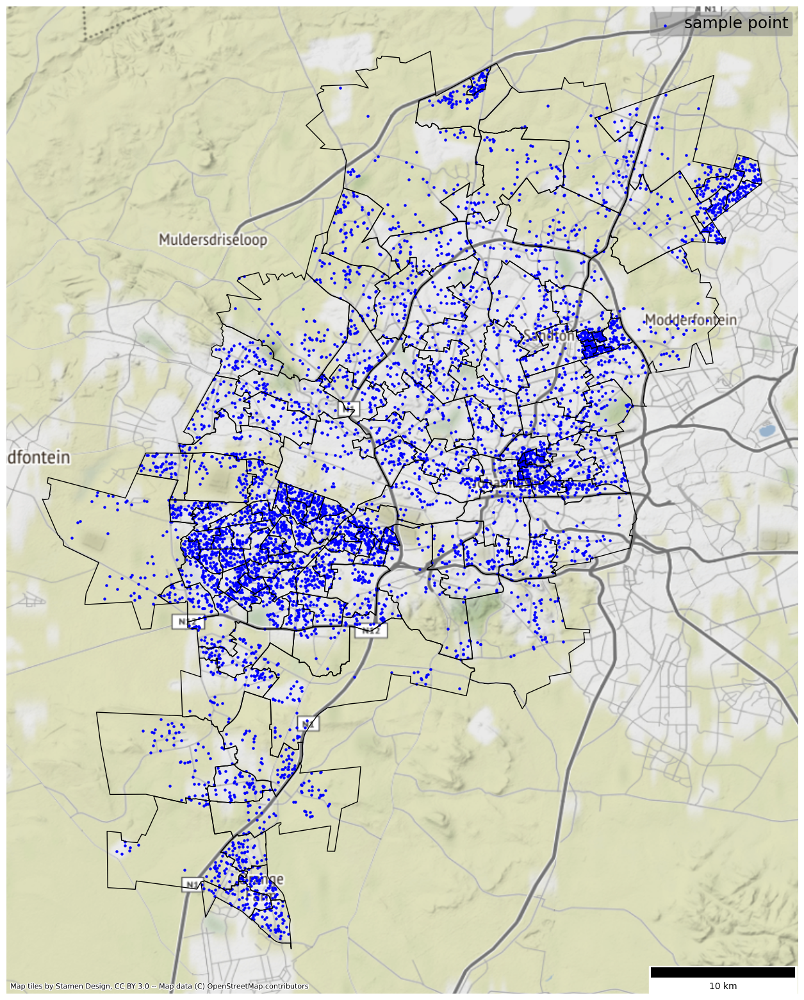

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))

# sample points
sample_points_gdf.plot(ax=ax, color='blue', markersize=5, label=f'sample point')

# geometry polygon of JHB_gdf
JHB_gdf.plot(ax=ax, facecolor='none', edgecolor='black')

# add basemap
ctx.add_basemap(ax, crs=sample_points_gdf.crs, source=ctx.providers.Stamen.Terrain)

# Add legend, scalebar
legend = ax.legend(loc='upper right', framealpha=0.5, fontsize='large')
legend.get_frame().set_facecolor('gray')

for text in legend.get_texts():
    text.set_fontsize(1.5 * text.get_fontsize())

ax.add_artist(ScaleBar(distance, location='lower right', units='km'))

plt.axis('off')
plt.show()